In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from mpl_toolkits.basemap import Basemap
from itertools import chain
import math
%matplotlib inline

# Project WP1-2
### code 7: extract routes between specific regions from hourly ais data
<span style='font-family:"Times New Roman"'> <span styel=''> 
    
This code is based on dataset "ais_hourly_withDistStartEndTerms_3000plus.csv" and "ports_update1.csv". 
Filter all the specific routes between differnet regions, ready for the next step in waypoints extracting. 
    
### Basic steps: 
    a) Load and check data;
    b) functions for data extraction;
    c) cases presentation;
    d) Save data and show cases;

In [2]:
df_longJ=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/cleanedData/ais_hourly_withDistStartEndTerms_3000plus.csv")

df_ports=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/cleanedData/ports_update1.csv")

In [55]:


def findmainPorts(df,regionName="Gulf"):
    """
    find all the main ports within a region
    return: list with all ports in a region
    """
    ports_region=[]
    for i, row in df[df.Region==regionName].iterrows():
        port=row["Port Group"]
        ports_region.append(port)
    ports_region=list(set(ports_region))
    
    return ports_region


def extractVoyages(df, start_region="Gulf",end_region="NE Asia"):
    """
    Filter voyages clusters between start region and end region. 
    return: dataframe with only ais data between start region and end region
    """
    
    ports_start=findmainPorts(df_ports,regionName=start_region)
    ports_end=findmainPorts(df_ports,regionName=end_region)
    
    masks=[]
    for port_s in ports_start:
        #print (" current start port is:",port_s)
        flag_s=(df.start_group==port_s)
        
        for port_e in ports_end:
            flag_e=(df.end_group==port_e)
            mask_temp=flag_s & flag_e
            masks.append(mask_temp)      
        
    temp=masks[0]
    for elem in masks[1:]:
        mask_all=temp|elem
        temp=mask_all
        
    df_start2end=df[mask_all]
    
    return df_start2end

def extractRegions(df,regions,flag_save=False):
    """
    filter data among any two regions, and save them into csv file
    return:None 
    regions: a list contain all regions
    flag_save: to save file or not
    """
    assert isinstance(regions, list) == True, "{} is not a list".format(regions)
    
    leng=len(regions)
    dirs="C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_routeRegions_hourly/"
    
    for i in range(leng):
        print ("--------------------------------------------------")
        start=regions[i]
        print ("Start region is:",start)
        f_s=start.replace(" ","_")
        for j in range(i+1,leng):
            end=regions[j]
            print ("------End region is:",end)
            df_start2end=extractVoyages(df, start_region=start,end_region=end)
            df_end2start=extractVoyages(df, start_region=end,end_region=start)
            f_e=end.replace(" ","_")
            
            if flag_save:
                df_start2end.to_csv(dirs+"aisH_"+f_s+"2"+f_e+".csv",index=False)
                df_end2start.to_csv(dirs+"aisH_"+f_e+"2"+f_s+".csv",index=False)
        print ("-------save file completed in this loop------")
        
def draw_map(m, scale=0.5):
    """
    plot backgroud map
    m: Basemap object
    scale: plot scale
    return: plot a backgroud map
    """
    # draw a shaded-relief image
    m.shadedrelief(scale=scale)
    #m.bluemarble(scale=scale)  #Project NASA's blue marble image onto the map
    #m.drawcoastlines()
    
    # lats and longs are returned as a dictionary
    lats = m.drawparallels(np.linspace(-90, 90, 13))
    lons = m.drawmeridians(np.linspace(-180, 180, 13))

    # keys contain the plt.Line2D instances
    lat_lines = chain(*(tup[1][0] for tup in lats.items()))
    lon_lines = chain(*(tup[1][0] for tup in lons.items()))
    all_lines = chain(lat_lines, lon_lines)
    
    # cycle through these lines and set the desired style
    for line in all_lines:
        line.set(linestyle='-', alpha=0.3, color='w')

def plotPorts(df,directory="C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/",file_name="longVoyage_3000.png"):
    """
    Plot ports on geomap
    df: dataframe with location coordinates
    """
    #bbox=(df.ais_position_latitude.min(),df.ais_position_latitude.max(),df.ais_position_longitude.min(),df.ais_position_longitude.max())                                                        
    bbox=(-30,60,100,330)
    #print ("The respective minimum and maximum latitude and longitude coordiates of ports are:",bbox)

    
    fig,ax=plt.subplots(figsize=(22,14))
    m = Basemap(ax=ax,projection='cyl',resolution='l',
                llcrnrlat=bbox[0], urcrnrlat=bbox[1],
                llcrnrlon=bbox[2], urcrnrlon=bbox[3])

    # df.ais_position_longitude    
    ax.scatter(df.ais_lon_new,df.Latitude,c=df.distance_nm,s=40) 
    draw_map(m)
    m.drawmeridians(np.arange(0,360,30),labels=[True,False,False,True],linewidth=0.5,fontsize=12)
    m.drawparallels(np.arange(-45,61,15),labels=[1,0,1,1], linewidth=0.5, fontsize=12)

    ax.set_xlim(bbox[2],bbox[3]);
    ax.set_ylim(bbox[0],bbox[1]);
    ax.set_xlabel("Longitude",fontsize=18)
    ax.set_ylabel("Latitude",fontsize=18)
    ax.xaxis.set_label_coords(0.55, -0.06)
    ax.yaxis.set_label_coords(-0.06,0.45)
    #ax.legend(loc='best',fontsize=10,frameon=False)
    #fig.savefig(directory+file_name,dpi=400)
    
def plotPorts_1(df,directory="C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/",file_name="longVoyage_3000.png"):
    """
    Plot ports on geomap
    df: dataframe with location coordinates
    """
    #bbox=(df.ais_position_latitude.min(),df.ais_position_latitude.max(),df.ais_position_longitude.min(),df.ais_position_longitude.max())                                                        
    bbox=(-90,90,-180,180)
    #print ("The respective minimum and maximum latitude and longitude coordiates of ports are:",bbox)

    
    fig,ax=plt.subplots(figsize=(22,14))
    m = Basemap(ax=ax,projection='cyl',resolution='l',
                llcrnrlat=bbox[0], urcrnrlat=bbox[1],
                llcrnrlon=bbox[2], urcrnrlon=bbox[3])

    # df.ais_position_longitude    
    ax.scatter(df.Longitude,df.Latitude,s=40) 
    draw_map(m)
    m.drawmeridians(np.arange(0,360,30),labels=[True,False,False,True],linewidth=0.5,fontsize=12)
    m.drawparallels(np.arange(-45,61,15),labels=[1,0,1,1], linewidth=0.5, fontsize=12)

    ax.set_xlim(bbox[2],bbox[3]);
    ax.set_ylim(bbox[0],bbox[1]);
    ax.set_xlabel("Longitude",fontsize=18)
    ax.set_ylabel("Latitude",fontsize=18)
    ax.xaxis.set_label_coords(0.55, -0.06)
    ax.yaxis.set_label_coords(-0.06,0.45)
    #ax.legend(loc='best',fontsize=10,frameon=False)
    #fig.savefig(directory+file_name,dpi=400)
    
def trans_coods(df):
    """
    transform the coordinates of longituds from format (-180,180) to format (0,360)
    return: a new dataframe with an extra column "ais_lon_new"
    """
    df_copy=df.copy()
    for ix,row in df_copy.iterrows():

        lon=row["Longitude"]

        if lon<=0:
            df_copy.at[ix,"ais_lon_new"]=lon+360
        else:
            df_copy.at[ix,"ais_lon_new"]=lon
    return df_copy

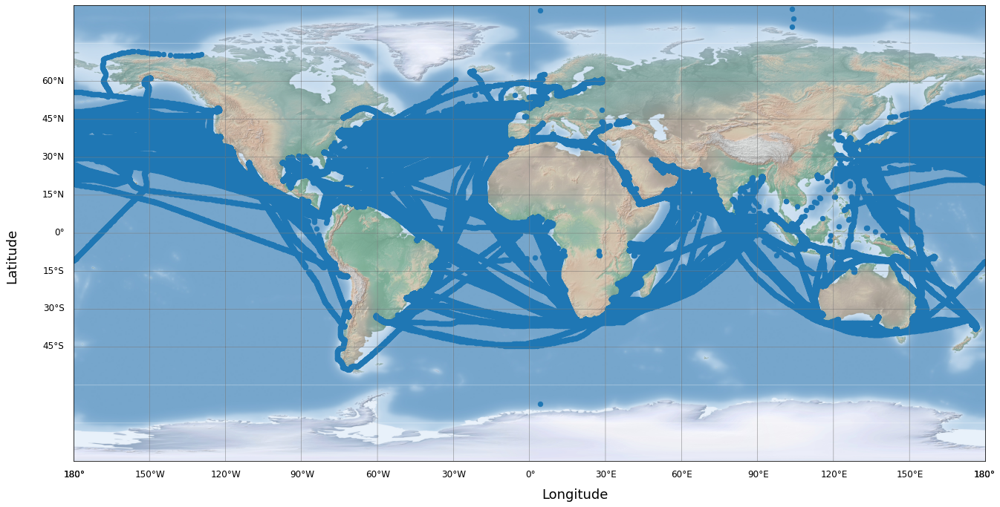

In [6]:
plotPorts_1(df_longJ)

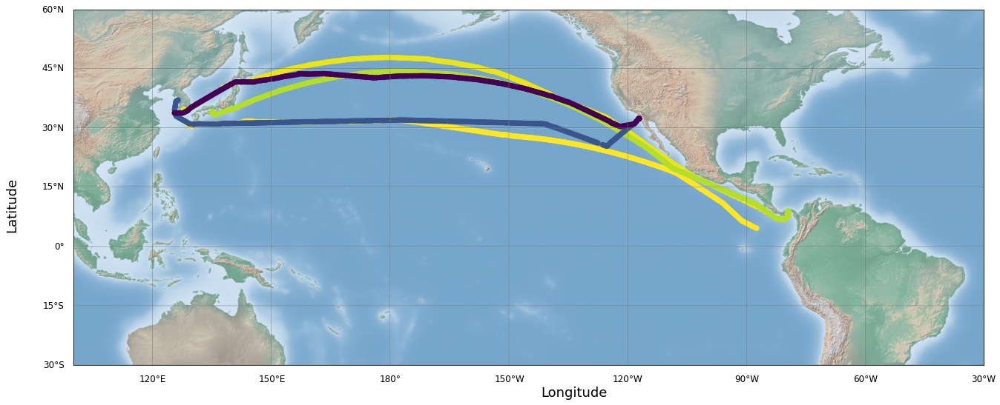

In [58]:
df_NEAsia2WLatin=extractVoyages(df_longJ, start_region="NE Asia",end_region="West Latin")
df_NEAsia2WLatin=trans_coods(df_NEAsia2WLatin)
plotPorts(df_NEAsia2WLatin)

In [31]:
df_WL2NEAsia=extractVoyages(df_longJ, start_region="West Latin",end_region="NE Asia")
df_WL2NEAsia=trans_coods(df_WL2NEAsia)

df_NWAme2WLatin=extractVoyages(df_longJ, start_region="NW Ame",end_region="West Latin")
df_NWAme2WLatin=trans_coods(df_NWAme2WLatin)

df_Carib2WLatin=extractVoyages(df_longJ, start_region="Caribbean",end_region="SE Asia")
df_Carib2WLatin=trans_coods(df_Carib2WLatin)

df_NWAme2NEAsia=extractVoyages(df_longJ, start_region="NW Ame",end_region="NE Asia")
df_NWAme2NEAsia=trans_coods(df_NWAme2NEAsia)

df_SWAme2EAsia=extractVoyages(df_longJ, start_region="SW Ame",end_region="East Asia")
df_SWAme2EAsia=trans_coods(df_SWAme2EAsia)

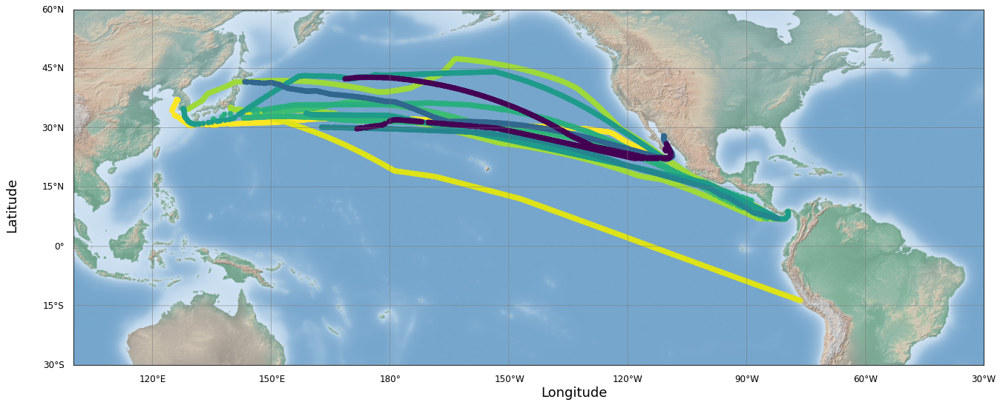

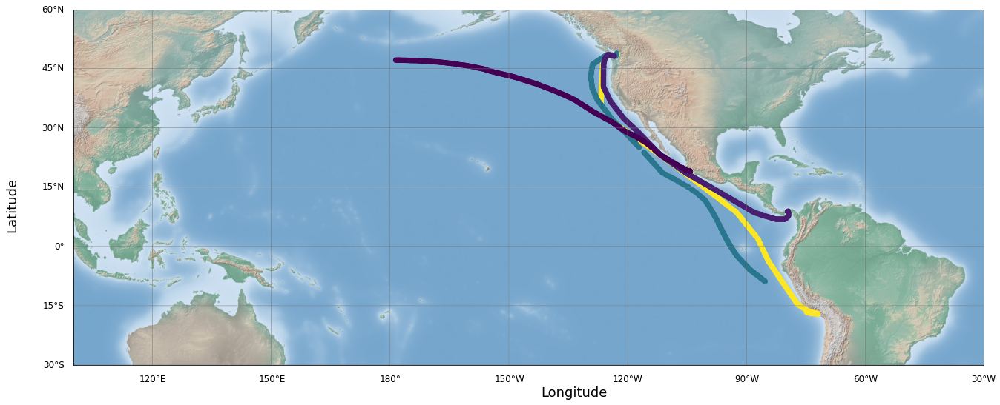

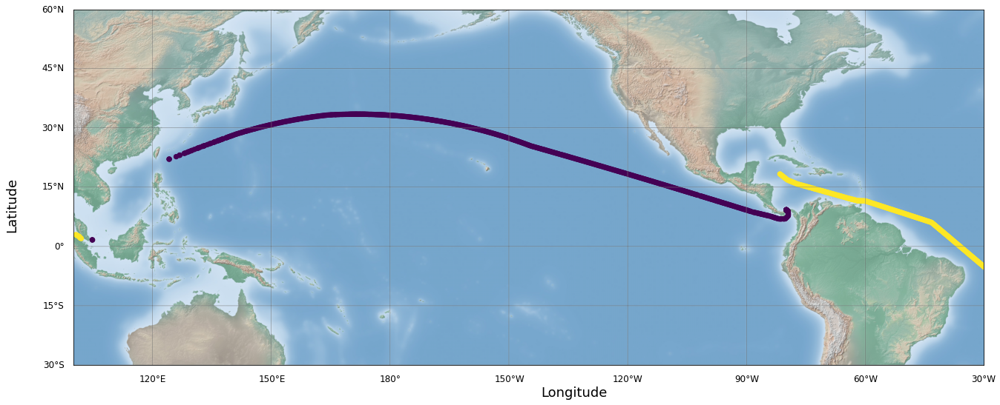

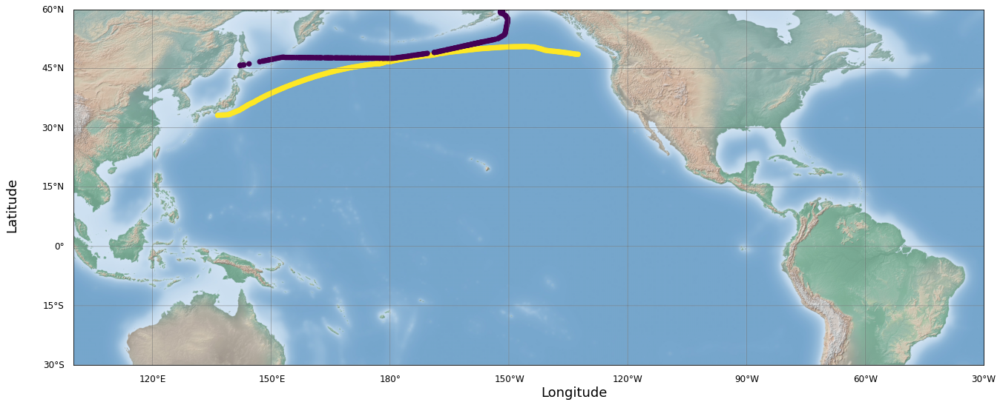

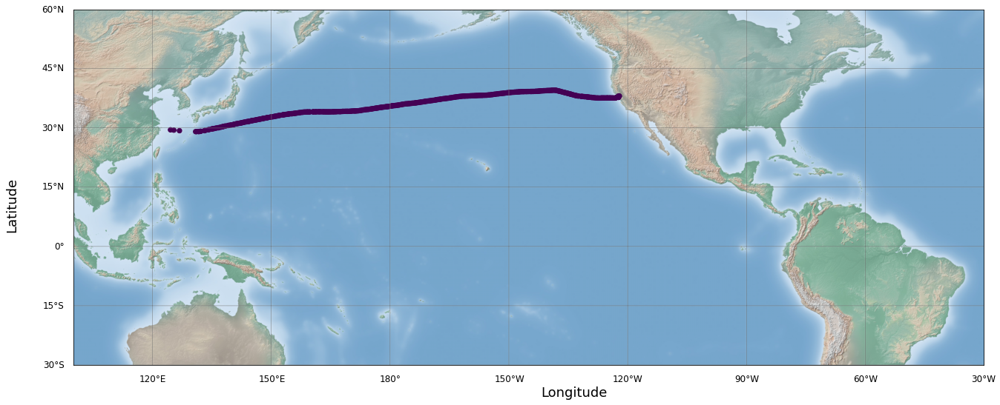

In [32]:
plotPorts( df_WL2NEAsia)
plotPorts(df_NWAme2WLatin)
plotPorts(df_Carib2WLatin)
plotPorts(df_NWAme2NEAsia)
plotPorts(df_SWAme2EAsia)

In [35]:
df_Gulf2ELatin=extractVoyages(df_longJ, start_region="Gulf",end_region="East Latin")
df_Gulf2ELatin=trans_coods(df_Gulf2ELatin)

df_Gulf2EAfrica=extractVoyages(df_longJ, start_region="Gulf",end_region="East Africa")
df_Gulf2EAfrica=trans_coods(df_Gulf2EAfrica)

df_Gulf2WLatin=extractVoyages(df_longJ, start_region="Gulf",end_region="West Latin")
df_Gulf2WLatin=trans_coods(df_Gulf2WLatin)

df_Gulf2Gulf=extractVoyages(df_longJ, start_region="Gulf",end_region="Gulf")
df_Gulf2Gulf=trans_coods(df_Gulf2Gulf)

df_Gulf2SWAme=extractVoyages(df_longJ, start_region="Gulf",end_region="SW Ame")
df_Gulf2SWAme=trans_coods(df_Gulf2SWAme)



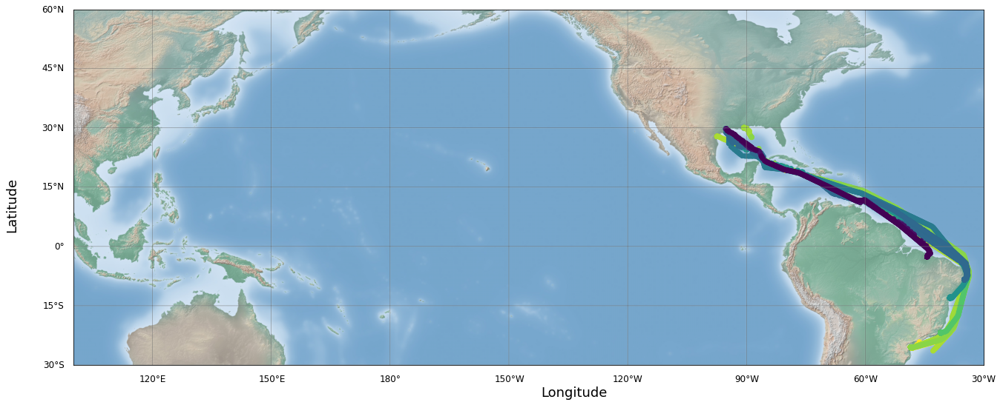

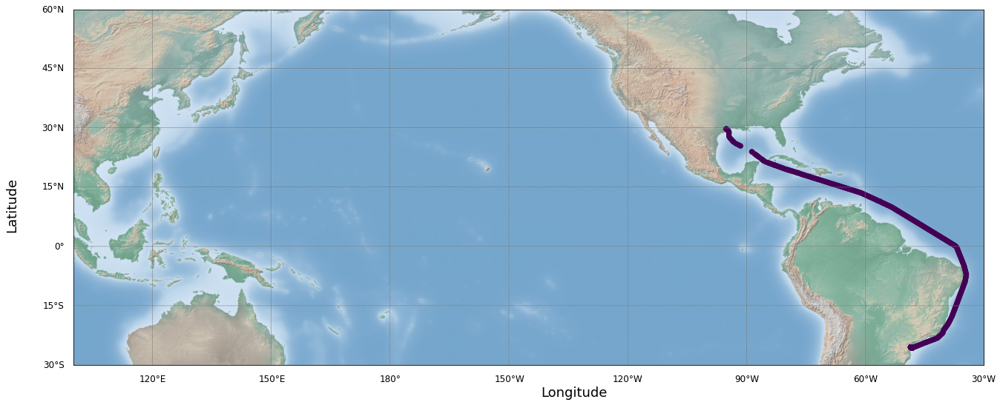

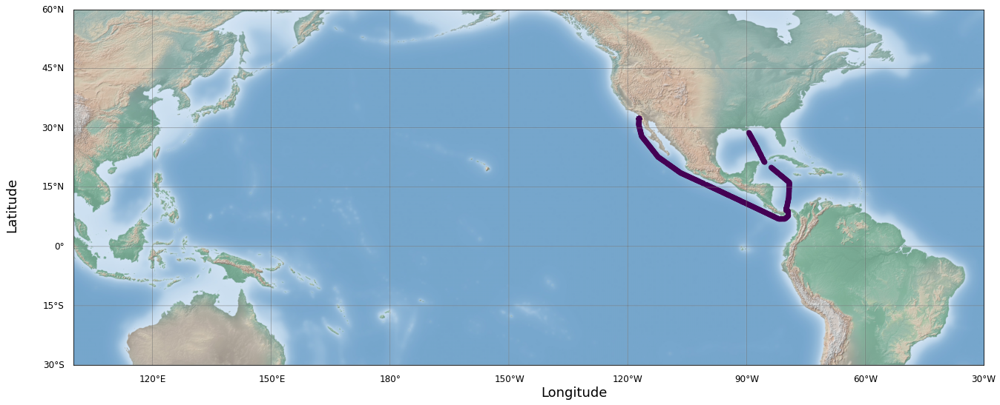

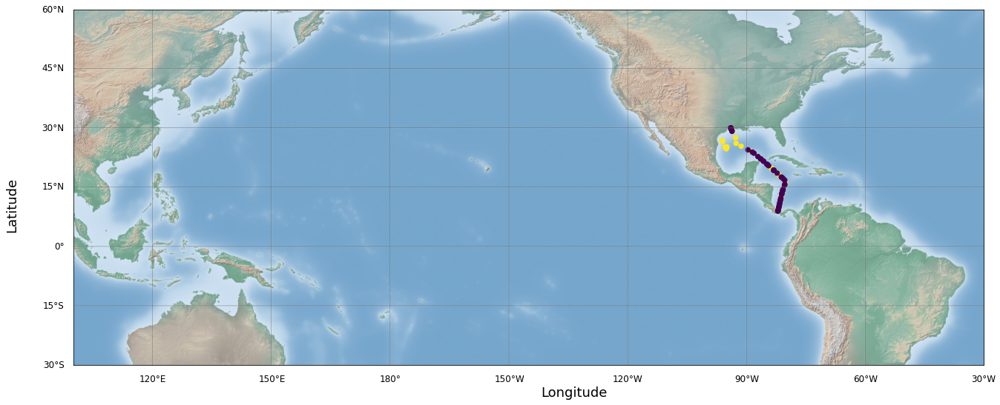

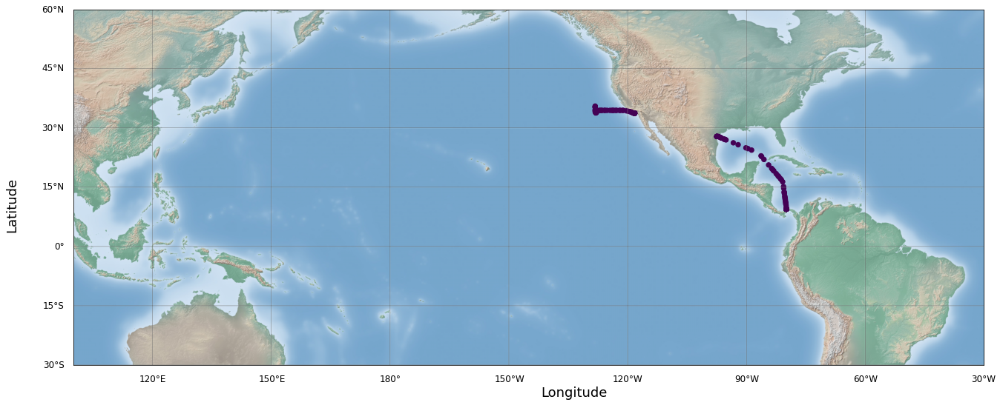

In [36]:
plotPorts(df_Gulf2ELatin)
plotPorts(df_Gulf2EAfrica)
plotPorts(df_Gulf2WLatin)
plotPorts(df_Gulf2Gulf)
plotPorts(df_Gulf2SWAme)

In [56]:
start_region=df_longJ.start_region.unique().tolist()
end_region=df_longJ.end_region.unique().tolist()
regions=list(set(start_region+end_region))


print (start_region)
print ("---------------------------------------------------------------------------------------------------------------------")
print (end_region)
print ("---------------------------------------------------------------------------------------------------------------------")
print (regions)

['Caribbean', 'Gulf', 'West Latin', 'Black sea', 'SW Africa', 'SW Ame', 'English channel', 'SE Asia', 'East Asia', 'Red sea', 'East Latin', 'Baltic', 'Mediterranean', 'Mid East', 'NE Asia', 'South Asia', 'East Africa', 'SE Ame', 'NW Ame', 'Oceania', 'West Africa', 'North sea', 'NE Ame', 'Arctic', 'SW Europe']
---------------------------------------------------------------------------------------------------------------------
['West Latin', 'SW Ame', 'East Asia', 'Mediterranean', 'East Latin', 'SW Africa', 'SE Asia', 'Gulf', 'English channel', 'Baltic', 'Red sea', 'South Asia', 'NE Asia', 'Mid East', 'Oceania', 'East Africa', 'Caribbean', 'NW Ame', 'NE Ame', 'SE Ame', 'West Africa', 'North sea', 'SW Europe', 'Black sea', 'Arctic']
---------------------------------------------------------------------------------------------------------------------
['Mediterranean', 'Red sea', 'SE Asia', 'Black sea', 'NW Ame', 'East Africa', 'Oceania', 'SW Ame', 'Mid East', 'SW Africa', 'West Africa', 'Ea

In [57]:
extractRegions(df_longJ,regions,flag_save=True)

--------------------------------------------------
Start region is: Mediterranean
------End region is: Red sea
------End region is: SE Asia
------End region is: Black sea
------End region is: NW Ame
------End region is: East Africa
------End region is: Oceania
------End region is: SW Ame
------End region is: Mid East
------End region is: SW Africa
------End region is: West Africa
------End region is: East Asia
------End region is: NE Asia
------End region is: SE Ame
------End region is: North sea
------End region is: Arctic
------End region is: English channel
------End region is: West Latin
------End region is: Gulf
------End region is: Baltic
------End region is: NE Ame
------End region is: South Asia
------End region is: Caribbean
------End region is: SW Europe
------End region is: East Latin
-------save file completed in this loop------
--------------------------------------------------
Start region is: Red sea
------End region is: SE Asia
------End region is: Black sea
------End r

------End region is: North sea
------End region is: Arctic
------End region is: English channel
------End region is: West Latin
------End region is: Gulf
------End region is: Baltic
------End region is: NE Ame
------End region is: South Asia
------End region is: Caribbean
------End region is: SW Europe
------End region is: East Latin
-------save file completed in this loop------
--------------------------------------------------
Start region is: SE Ame
------End region is: North sea
------End region is: Arctic
------End region is: English channel
------End region is: West Latin
------End region is: Gulf
------End region is: Baltic
------End region is: NE Ame
------End region is: South Asia
------End region is: Caribbean
------End region is: SW Europe
------End region is: East Latin
-------save file completed in this loop------
--------------------------------------------------
Start region is: North sea
------End region is: Arctic
------End region is: English channel
------End region i